# Sea ice classification: Histograms
The image histogram provides information we can use to identify which k-means clusters can be labeled as sea ice floes. We use the data loader to access images from the Ice Floe Validation Dataset on Github. The file `data/validation_dataset_testtrain_split.csv` is created in the cloudmask calibration stage and divides cases into testing and training datasets.

This notebook demonstrates the peak identification and division of image regions by possibility of being sea ice. We'll use the new data loader to access images from GitHub. The notebook should be run start to finish for each of the case types: clear sky, moderate cloud, cloudy, and full cloud (no ice).

In [108]:
using Pkg
Pkg.activate("../scripts/cal-val/")
using Images
using IceFloeTracker
using CSV
using CairoMakie
using DataFrames
using Peaks

df = DataFrame(CSV.File("../data/validation_dataset_testtrain_split.csv"));
df_training = copy(df[df.training,:]);

clear_sky_training_cases = df_training[df_training.cloud_fraction_manual .< 0.25  .&& (df_training.visible_sea_ice .== "yes"), [:case_number, :satellite]];
clear_sky_training_cases = combine(first, groupby(clear_sky_training_cases, :case_number))
clear_sky_training_cases = [(x, y) for (x, y) in zip(clear_sky_training_cases.case_number, clear_sky_training_cases.satellite)]

moderately_cloudy_training_cases = df_training[df_training.cloud_fraction_manual .>= 0.25 .&& df_training.cloud_fraction_manual .<= 0.75  .&& (df_training.visible_sea_ice .== "yes"),  [:case_number, :satellite]];
moderately_cloudy_training_cases = combine(first, groupby(moderately_cloudy_training_cases, :case_number))
moderately_cloudy_training_cases = [(x, y) for (x, y) in zip(moderately_cloudy_training_cases.case_number, moderately_cloudy_training_cases.satellite)];

cloudy_training_cases = df_training[df_training.cloud_fraction_manual .> 0.75  .&& (df_training.visible_sea_ice .== "yes"),  [:case_number, :satellite]];
cloudy_training_cases = combine(first, groupby(cloudy_training_cases, :case_number))
cloudy_training_cases = [(x, y) for (x, y) in zip(cloudy_training_cases.case_number, cloudy_training_cases.satellite)];

cloudy_no_ice_training_cases = df_training[df_training.cloud_fraction_manual .> 0.25  .&& (df_training.visible_sea_ice .== "no"),  [:case_number, :satellite]];
cloudy_no_ice_training_cases = combine(first, groupby(cloudy_no_ice_training_cases, :case_number))
cloudy_no_ice_training_cases = [(x, y) for (x, y) in zip(cloudy_no_ice_training_cases.case_number, cloudy_no_ice_training_cases.satellite)];

  Activating project at `~/Documents/research/manuscripts/cal-val_ice_floe_tracker/calval_tgrs/scripts/cal-val`


In [183]:
# choose a case set and comment out the rest
case_selector = function(c)
    # return (c.case_number, c.satellite) in clear_sky_training_cases
    # return (c.case_number, c.satellite) in moderately_cloudy_training_cases
    return (c.case_number, c.satellite) in cloudy_training_cases[1:18] # One case at least seems to fail
    # return (c.case_number, c.satellite) in cloudy_no_ice_training_cases
end

#227 (generic function with 1 method)

In [184]:
# Selects largest peak in the sea ice region of the histogram.
function get_ice_peaks(edges, counts; possible_ice_threshold::Float64=0.30, minimum_prominence::Float64=0.05, window::Int64=3)
    size(counts)
    counts = counts[1:end]
    normalizer = sum(counts[edges .> possible_ice_threshold])
    counts = normalizer > 0 ? counts ./ normalizer : return Inf
    pks = findmaxima(counts, window) |> peakproms! |> peakwidths!
    pks_df = DataFrame(pks[Not(:data)])
    pks_df = sort(pks_df, :proms, rev=true)
    maximum(pks_df.proms) < minimum_prominence && return Inf
    return edges[pks_df[argmax(pks_df.proms), :indices]] 
end

get_ice_peaks (generic function with 1 method)

In [185]:
# This file is in the development version of IFT.jl
# It contains some very nice tools for accessing the validation and calibration dataset
include("/Users/dwatkin2/Documents/research/packages/IceFloeTracker.jl/src/validation_data.jl")

_get_file (generic function with 1 method)

In [180]:
function compute_metrics(binary_segmented, binary_labeled, land_mask, cloud_mask)
## Utility functions for measuring outputΩ
    valid_idx = (land_mask .== 0) .&& (cloud_mask .== 0)
    agreement = sum(binary_segmented[valid_idx] .&& binary_labeled[valid_idx])
    return (precision=round(agreement/sum(binary_segmented), digits=2),
            recall=round(agreement/sum(binary_labeled), digits=2))
end

compute_metrics (generic function with 1 method)

In [181]:
# For visualization and setup, we're looking at the first 18. Next, we should shuffle the cases.

In [186]:
cloud_mask_settings = (
    prelim_threshold=53.0/255.,
    band_7_threshold=130.0/255.,
    band_2_threshold=169.0/255.,
    ratio_lower=0.0,
    ratio_offset=0.0,
    ratio_upper=0.53
)
cmask = LopezAcostaCloudMask(cloud_mask_settings...)

tc_images = Dict()
fc_images = Dict()
landmasks = Dict()
cloudmasks = Dict()

idx = 0
for case in data_loader(c -> case_selector(c))    
    if idx < 18
        print(idx, ", ", case.name, "\n")
        tc_images[case.name] =  RGB.(case.modis_truecolor)
        fc_images[case.name] =  RGB.(case.modis_falsecolor)
        cloudmasks[case.name] = Gray.(IceFloeTracker.create_cloudmask(fc_images[case.name], cmask)) .> 0
        landmasks[case.name] =  Gray.(case.modis_landmask) .> 0
    end
    idx += 1
    
end

plot_cases = [x for x in keys(fc_images)]

┌ Warning: In /tmp/Watkins2025/a451cd5e62a10309a9640fbbe6b32a236fcebc70/validation_dataset.csv line 381 has 0 fields but 28 fields are expected. Skipping row.
└ @ TextParse ~/.julia/packages/TextParse/bX5Ws/src/csv.jl:390


0, 003-baffin_bay-100km-20120419-terra-250m
1, 004-baffin_bay-100km-20190925-aqua-250m
2, 010-baffin_bay-100km-20210602-terra-250m
3, 013-baffin_bay-100km-20120527-aqua-250m
4, 021-baffin_bay-100km-20140329-terra-250m
5, 022-barents_kara_seas-100km-20060909-aqua-250m
6, 024-barents_kara_seas-100km-20150426-aqua-250m
7, 027-barents_kara_seas-100km-20130422-terra-250m
8, 030-barents_kara_seas-100km-20110510-aqua-250m
9, 031-barents_kara_seas-100km-20150428-aqua-250m
10, 034-barents_kara_seas-100km-20200710-aqua-250m
11, 036-barents_kara_seas-100km-20200701-aqua-250m
12, 037-barents_kara_seas-100km-20070326-aqua-250m
13, 040-barents_kara_seas-100km-20070912-aqua-250m
14, 042-barents_kara_seas-100km-20210910-aqua-250m
15, 044-beaufort_sea-100km-20200808-aqua-250m
16, 047-beaufort_sea-100km-20220302-aqua-250m
17, 050-beaufort_sea-100km-20070902-aqua-250m


18-element Vector{String}:
 "022-barents_kara_seas-100km-20060909-aqua-250m"
 "027-barents_kara_seas-100km-20130422-terra-250m"
 "003-baffin_bay-100km-20120419-terra-250m"
 "030-barents_kara_seas-100km-20110510-aqua-250m"
 "034-barents_kara_seas-100km-20200710-aqua-250m"
 "040-barents_kara_seas-100km-20070912-aqua-250m"
 "010-baffin_bay-100km-20210602-terra-250m"
 "036-barents_kara_seas-100km-20200701-aqua-250m"
 "042-barents_kara_seas-100km-20210910-aqua-250m"
 "031-barents_kara_seas-100km-20150428-aqua-250m"
 "044-beaufort_sea-100km-20200808-aqua-250m"
 "024-barents_kara_seas-100km-20150426-aqua-250m"
 "037-barents_kara_seas-100km-20070326-aqua-250m"
 "004-baffin_bay-100km-20190925-aqua-250m"
 "050-beaufort_sea-100km-20070902-aqua-250m"
 "013-baffin_bay-100km-20120527-aqua-250m"
 "047-beaufort_sea-100km-20220302-aqua-250m"
 "021-baffin_bay-100km-20140329-terra-250m"

## View cases

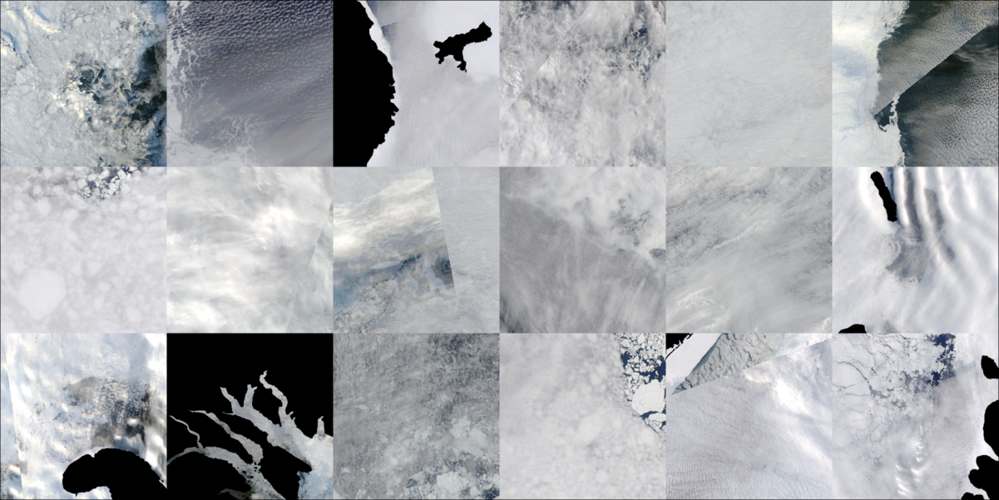

In [187]:
Images.mosaicview([tc_images[name] .* .!landmasks[name] for name in plot_cases[1:18]], nrow=3, rowmajor=true)

In [200]:
case = "004-baffin_bay-100km-20190925-aqua-250m"
sum(.!landmasks[case])

37223

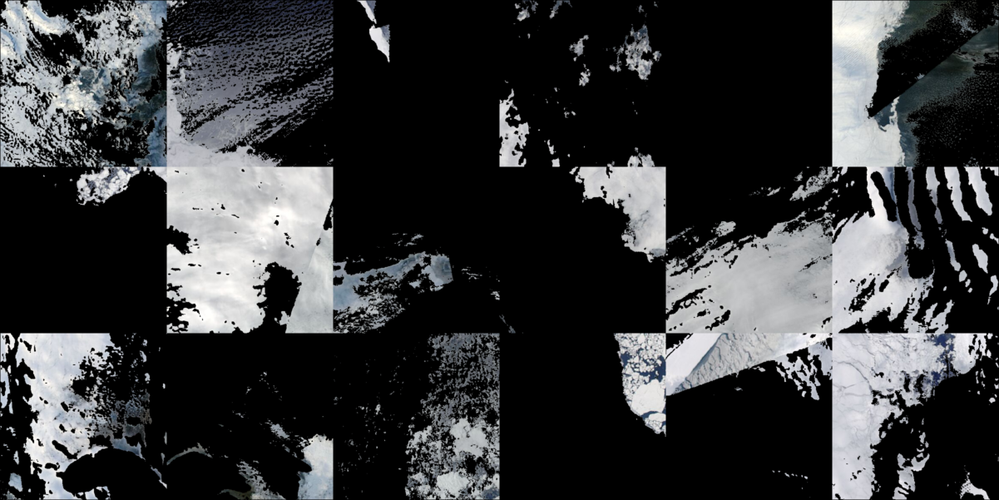

In [188]:
Images.mosaicview([tc_images[name] .* .!landmasks[name] .* .!(cloudmasks[name] .> 0) for name in plot_cases[1:18]], nrow=3, rowmajor=true)

The training cases for the clear sky (<20% cloud) cases include a few especially important comparison points: cases with very bright landfast ice, cases with darker but distinct ice floes, cases with a smaller number of ocean pixels, and cases with only slush/below-resolution ice floes. (Visible floes = "no")

The question: Does separating by the brightest peak tend to highlight the true floe brightnesses? If the peak of the band2 brightness is low, can we rule out the presence of ice floes?

The no-ice cases show similar histograms to


## View histograms

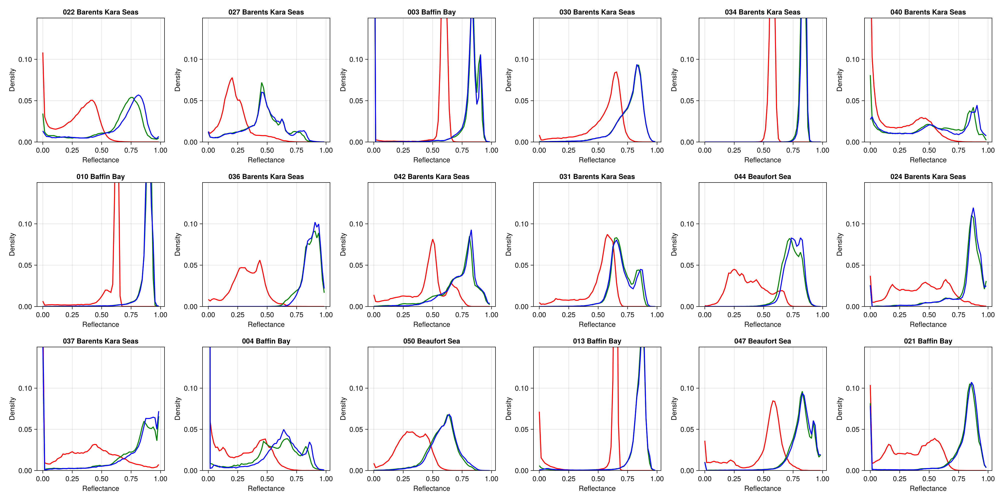

In [189]:
f = Figure(size=(2000, 1000))
count = 1
possible_ice_threshold = 0.3
cases = [x for x in keys(fc_images)]
for i in range(1, 3)
    for j in range(1, 6)
        if count <= length(cases)
            case = cases[count]
            case_title = titlecase(replace(join(split(case, "-")[1:2], " "), "_"=>" "))
            
            ax = CairoMakie.Axis(f[i, j], title=case_title, 
                ylabel="Density", xlabel="Reflectance", xticks=range(0, 1, 5))

            for (color, band) in zip([:red, :green, :blue],
                    [red.(fc_images[case] .* .!landmasks[case]),
                     green.(fc_images[case] .* .!landmasks[case]),
                     blue.(fc_images[case] .* .!landmasks[case])])
                        
                edges, counts = ImageContrastAdjustment.build_histogram(band, 64; minval=0, maxval=1)
                # only normalize the blue and green channels
                # if color != :red
                #     lines!(ax, edges, counts[1:end] ./ sum(counts[1:end][edges .> possible_ice_threshold]),
                #         linewidth=2, color=color)
                # else
                
                # normalize by all but the zero bin (since that has all the zeroed-out land data in it)
                lines!(ax, edges, counts[1:end] ./ sum(counts[2:end]), linewidth=2, color=color)
                
            end
            ylims!(0, 0.15)
            # ice_peak = get_ice_peaks(edges, counts; minimum_prominence=0.01)
            count += 1
        end
    end
end

# band2 = [LineElement(color = :green, linestyle = "-")]
# band1 = [LineElement(color = :blue, linestyle = "-")]
# Legend(f[3, 6], [band2, band1], ["Band 2", "Band 1"])

current_figure()

In [230]:
print("Num  LF   CF   CaseName \n")
for case in plot_cases
    cm = cloudmasks[case]
    lm = landmasks[case]
    n = prod(size(landmasks[case]))
    ocean_pix = sum(.!lm)
    cloud_free_ocean_pix = sum(.!lm .&& .!cm)
    print(split(case, "-")[1], " ", rpad(round(ocean_pix/n, digits=2), 4), " ",
        rpad(round(cloud_free_ocean_pix / ocean_pix, digits=2), 4), "  ", case, "\n")
end 

Num  LF   CF   CaseName 
022 1.0  0.62  022-barents_kara_seas-100km-20060909-aqua-250m
027 1.0  0.53  027-barents_kara_seas-100km-20130422-terra-250m
003 0.67 0.03  003-baffin_bay-100km-20120419-terra-250m
030 1.0  0.11  030-barents_kara_seas-100km-20110510-aqua-250m
034 1.0  0.0   034-barents_kara_seas-100km-20200710-aqua-250m
040 1.0  0.58  040-barents_kara_seas-100km-20070912-aqua-250m
010 1.0  0.06  010-baffin_bay-100km-20210602-terra-250m
036 1.0  0.88  036-barents_kara_seas-100km-20200701-aqua-250m
042 1.0  0.13  042-barents_kara_seas-100km-20210910-aqua-250m
031 1.0  0.18  031-barents_kara_seas-100km-20150428-aqua-250m
044 1.0  0.56  044-beaufort_sea-100km-20200808-aqua-250m
024 0.97 0.45  024-barents_kara_seas-100km-20150426-aqua-250m
037 0.86 0.49  037-barents_kara_seas-100km-20070326-aqua-250m
004 0.23 0.48  004-baffin_bay-100km-20190925-aqua-250m
050 1.0  0.27  050-beaufort_sea-100km-20070902-aqua-250m
013 1.0  0.14  013-baffin_bay-100km-20120527-aqua-250m
047 0.99 0.24  047

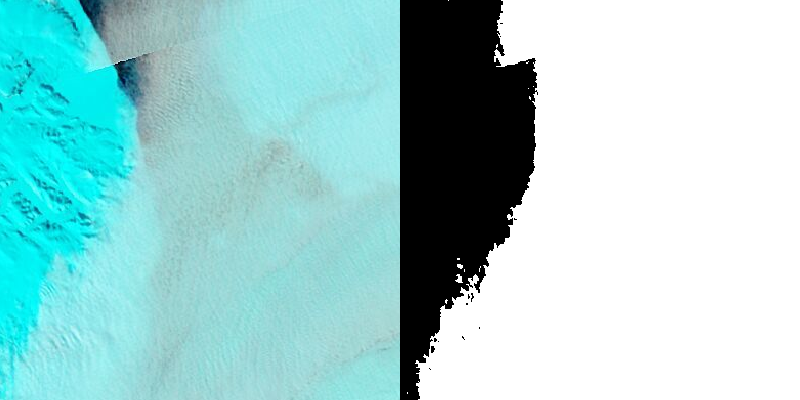

In [232]:
case = "003-baffin_bay-100km-20120419-terra-250m"
Images.mosaicview(fc_images[case], Gray.(cloudmasks[case]), nrow=1)

In [190]:
# Identify regions brighter than the peak
b2_images = Dict()
b1_images = Dict()
for case in plot_cases
    edges, counts = ImageContrastAdjustment.build_histogram(
        green.(fc_images[case]), 64; minval=0, maxval=1)
    ice_peak = get_ice_peaks(edges, counts; minimum_prominence=0.01, window=2)
    
    b2_images[case] =  Gray.(green.(fc_images[case]) .> ice_peak)

    edges, counts = ImageContrastAdjustment.build_histogram(
        blue.(fc_images[case]), 64; minval=0, maxval=1)
    ice_peak = get_ice_peaks(edges, counts; minimum_prominence=0.01, window=2)
    b1_images[case] =  Gray.(blue.(fc_images[case]) .> ice_peak)
end

# Brighter than Band 1 image peak

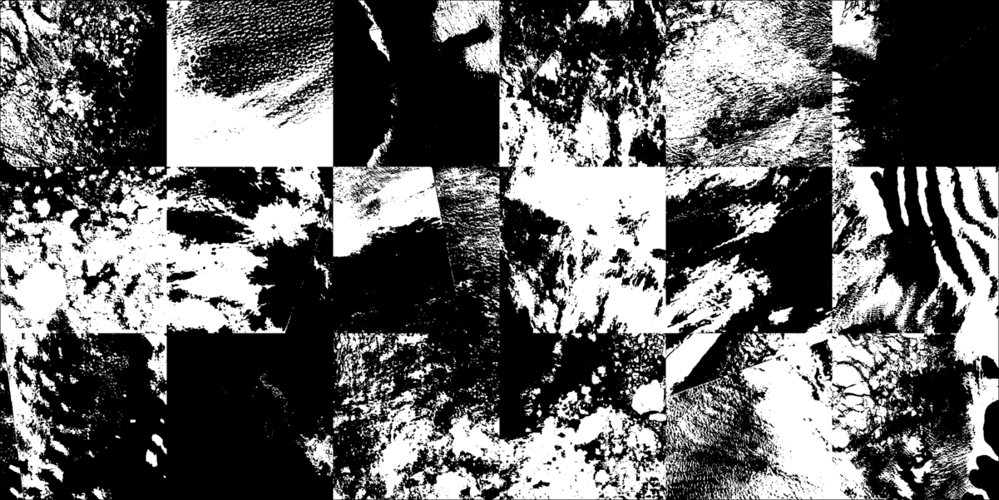

In [191]:
Images.mosaicview([b1_images[name] .* .!landmasks[name] for name in plot_cases], nrow=3, rowmajor=true)

# Brighter than Band 2 Image Peak

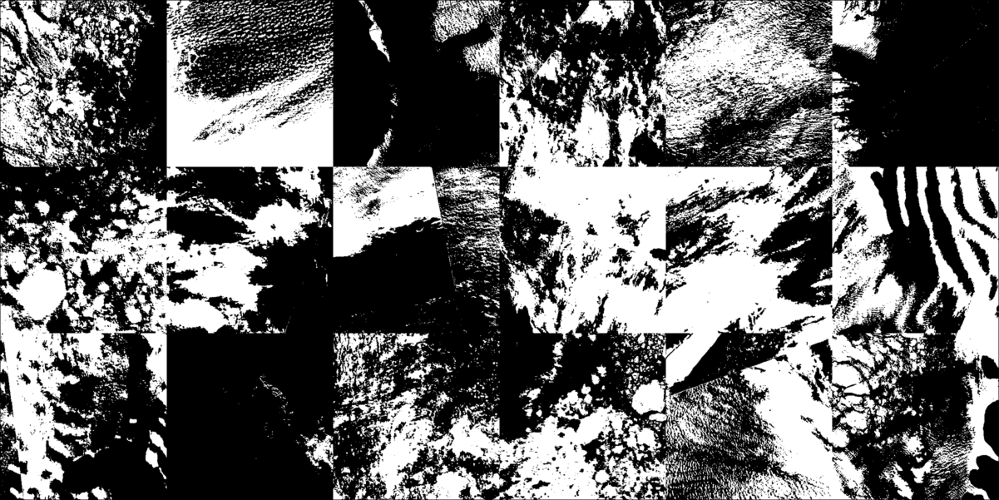

In [192]:
Images.mosaicview([b2_images[name] .* .!landmasks[name] for name in plot_cases], nrow=3, rowmajor=true)

# Brighter than either peak

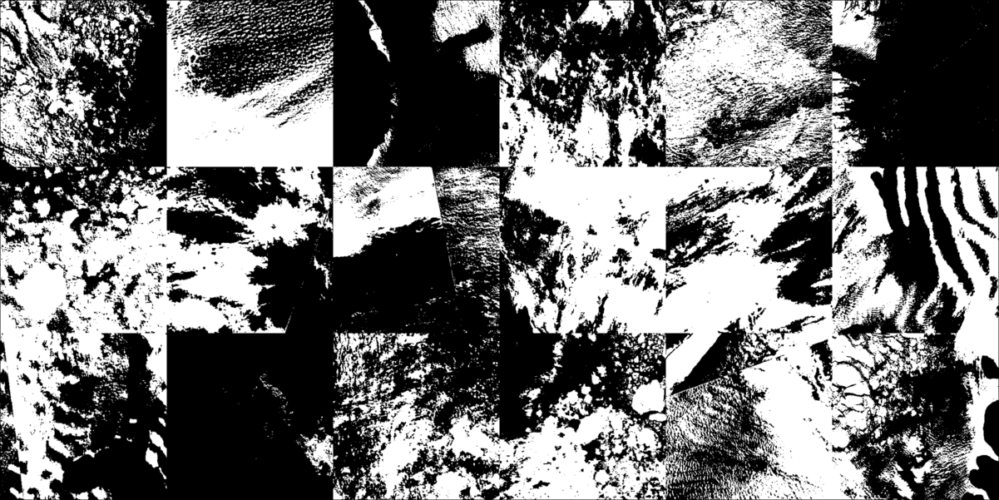

In [193]:
Images.mosaicview([Gray.((b1_images[name] .> 0 .|| b2_images[name] .> 0) .* .!landmasks[name]) for name in keys(tc_images)], nrow=3, rowmajor=true)

# Brighter than both peaks

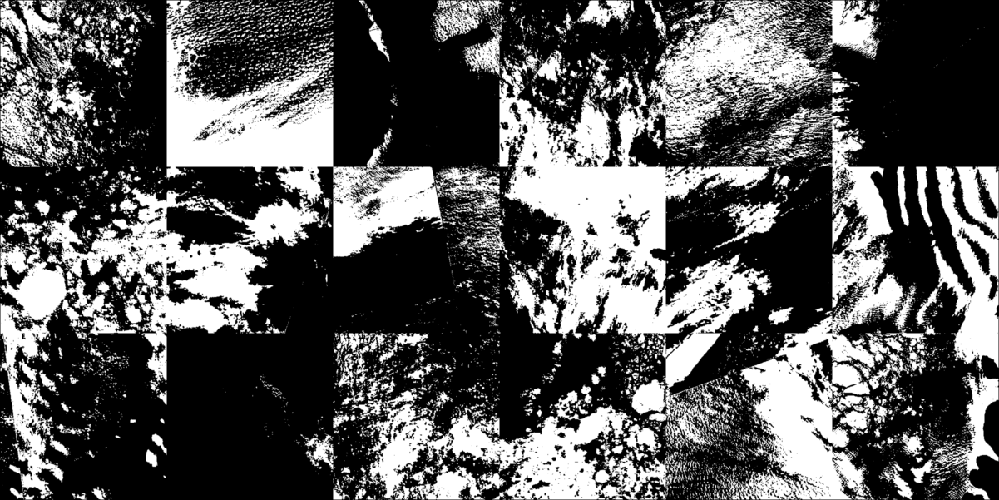

In [194]:
Images.mosaicview([Gray.((b1_images[name] .> 0 .&& b2_images[name] .> 0) .* .!landmasks[name]) for name in keys(tc_images)], nrow=3, rowmajor=true)

## Test case: extending to using the midpoint technique
Here, we look at the median of the Band 2 data between the possible ice threshold and the peak.

In [195]:
plot_cases

18-element Vector{String}:
 "022-barents_kara_seas-100km-20060909-aqua-250m"
 "027-barents_kara_seas-100km-20130422-terra-250m"
 "003-baffin_bay-100km-20120419-terra-250m"
 "030-barents_kara_seas-100km-20110510-aqua-250m"
 "034-barents_kara_seas-100km-20200710-aqua-250m"
 "040-barents_kara_seas-100km-20070912-aqua-250m"
 "010-baffin_bay-100km-20210602-terra-250m"
 "036-barents_kara_seas-100km-20200701-aqua-250m"
 "042-barents_kara_seas-100km-20210910-aqua-250m"
 "031-barents_kara_seas-100km-20150428-aqua-250m"
 "044-beaufort_sea-100km-20200808-aqua-250m"
 "024-barents_kara_seas-100km-20150426-aqua-250m"
 "037-barents_kara_seas-100km-20070326-aqua-250m"
 "004-baffin_bay-100km-20190925-aqua-250m"
 "050-beaufort_sea-100km-20070902-aqua-250m"
 "013-baffin_bay-100km-20120527-aqua-250m"
 "047-beaufort_sea-100km-20220302-aqua-250m"
 "021-baffin_bay-100km-20140329-terra-250m"

Case: 027-barents_kara_seas-100km-20130422-terra-250m
Midpoint: 0.4
Peak: 0.45

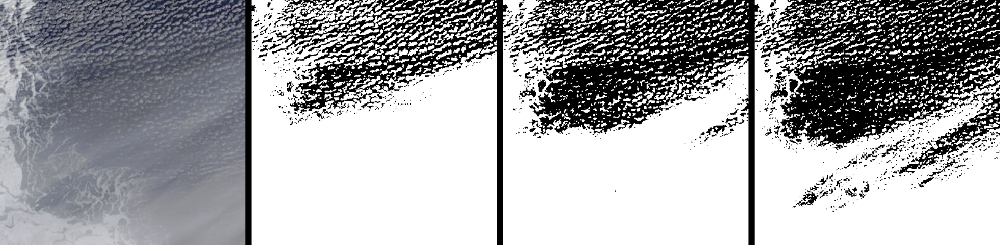

In [198]:
using StatsBase

# case = "063-beaufort_sea-100km-20070711-aqua-250m"
case = plot_cases[2]
# case = "128-hudson_bay-100km-20190415-aqua-250m"

b2 = vec(green.(fc_images[case] .* .! landmasks[case]))
fc = fc_images[case] .* .! landmasks[case] #.* .! cloudmasks[case]
pk = get_ice_peaks(build_histogram(green.(fc), 64; minval=0, maxval=1)..., minimum_prominence=0.01)
possible_ice = 0.3
medpoint = median(b2[(b2 .> possible_ice) .&& (b2 .< pk)])
# tiepoint = 0.5 * (possible_ice + pk)

ice_pixels = Gray.(green.(fc) .> possible_ice)
ice_median_threshold = Gray.(green.(fc) .> medpoint)
# ice_tiepoint_threshold = Gray.(green.(fc_images[case]) .> tiepoint)
ice_peak_threshold = Gray.(green.(fc) .> pk)
print("Case: ", case, "\n")
print("Midpoint: ", round(medpoint, digits=2), "\n")
# print("Tiepoint: ", tiepoint, "\n")
print("Peak: ", round(pk, digits=2))
Images.mosaicview([tc_images[case],        
        ice_pixels,
        # ice_tiepoint_threshold,
        ice_median_threshold,
        ice_peak_threshold
        ], nrow=1, npad=10)

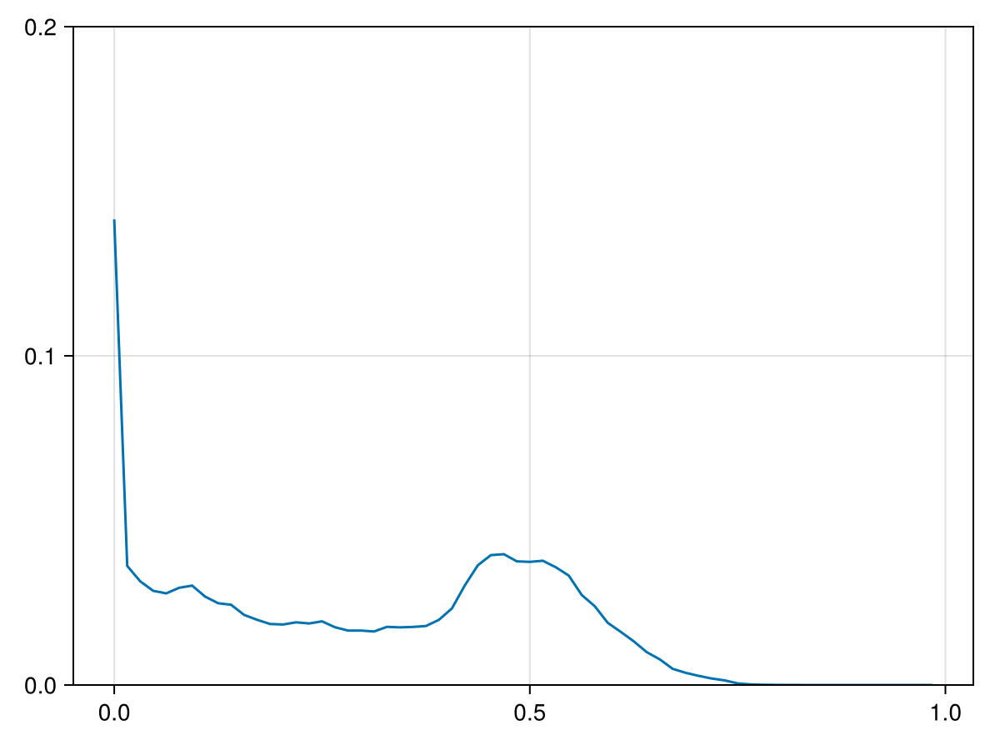

In [176]:
edges, counts = build_histogram(green.(fc), 64; minval=0, maxval=1)
lines(edges, counts[1:end] / sum(counts[3:end]))
ylims!(0, 0.2)
current_figure()

## Notes on specific cases
### Clear sky cases
* 181 test case for rejecting floes that don't have the properties of trackable ice floes
* 111 for being able to get floes and land ice in the same image
* 128 second smaller and brighter peak represents landfast ice
* 054 visualized in LabArchives
* 014 visualized in LabArchives
* 063 visualized in LabArchives

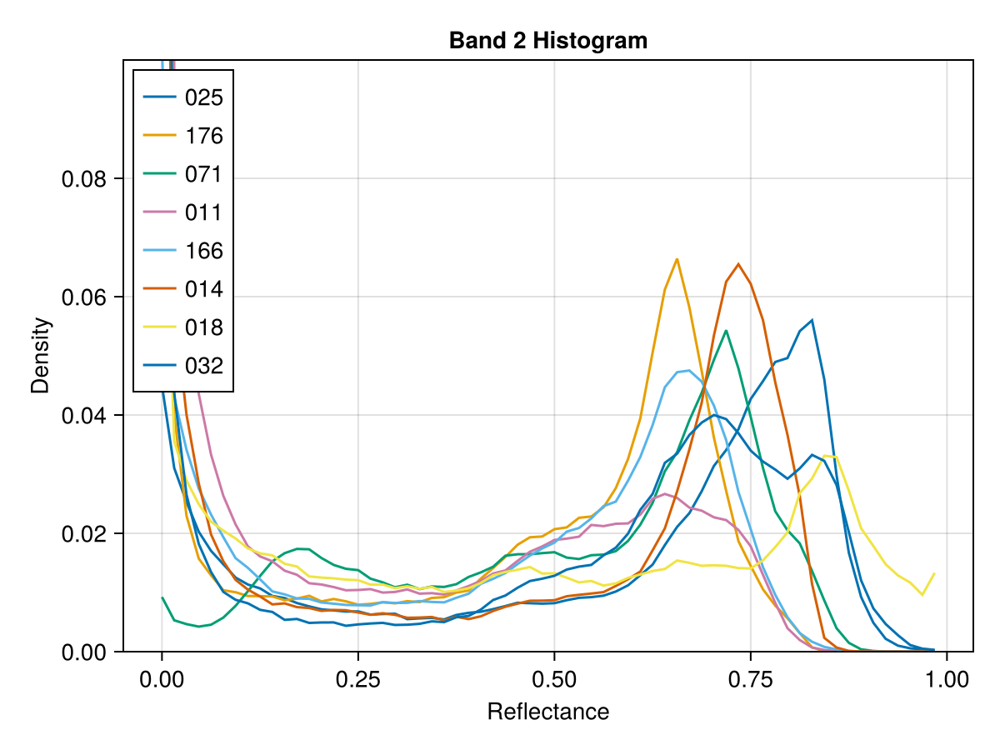

In [221]:
using CairoMakie
# Cases with dim peaks
plot_cases = ["181-sea_of_okhostk-100km-20140312-aqua-250m", "136-hudson_bay-100km-20120814-aqua-250m"]

# Cases with prominent peaks
plot_cases = ["048-beaufort_sea-100km-20210427-aqua-250m",
"006-baffin_bay-100km-20220530-terra-250m",
"054-beaufort_sea-100km-20150516-aqua-250m",
"128-hudson_bay-100km-20190415-aqua-250m",
"138-hudson_bay-100km-20200509-aqua-250m",
"063-beaufort_sea-100km-20070711-aqua-250m"]

# Cases with less prominent peaks
plot_cases = ["025-barents_kara_seas-100km-20090302-aqua-250m",
"176-sea_of_okhostk-100km-20190427-terra-250m",
"071-bering_chukchi_seas-100km-20090523-terra-250m",
"011-baffin_bay-100km-20110702-aqua-250m",
"166-laptev_sea-100km-20160904-aqua-250m",
"014-baffin_bay-100km-20220706-aqua-250m",
"018-baffin_bay-100km-20120915-aqua-250m",
"032-barents_kara_seas-100km-20140501-aqua-250m"]

f = Figure()
ax = CairoMakie.Axis(f[1, 1], title="Band 2 Histogram", 
    ylabel="Density", xlabel="Reflectance", xticks=range(0, 1, 5))

for case in plot_cases
    
    edges, counts = ImageContrastAdjustment.build_histogram(
        green.(fc_images[case]), 64; minval=0, maxval=1)
    counts = counts[1:end]
    counts = counts ./ sum(counts[2:end]) # normalize by the non-zero pixels
    lines!(ax, edges, counts, label=split(case, "-")[1])
end
axislegend(position=:lt)
ylims!(0, 0.1)
current_figure()

In [131]:
# load cloudmask
cm_dataloc = "../data/validation_dataset/cloudmask/"
prefix = occursin("terra", case) ? replace(case, "-terra-250m" => ".terra") : replace(case, "-aqua-250m" => ".aqua") 
cm_file = prefix * ".cloudmask.250m.tiff"
Images.mosaicview(fc_images[case], tc_images[case], landmasks[case], cloudmasks[case], morphed, labeled, nrow=2)

LoadError: UndefVarError: `falsecolor` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

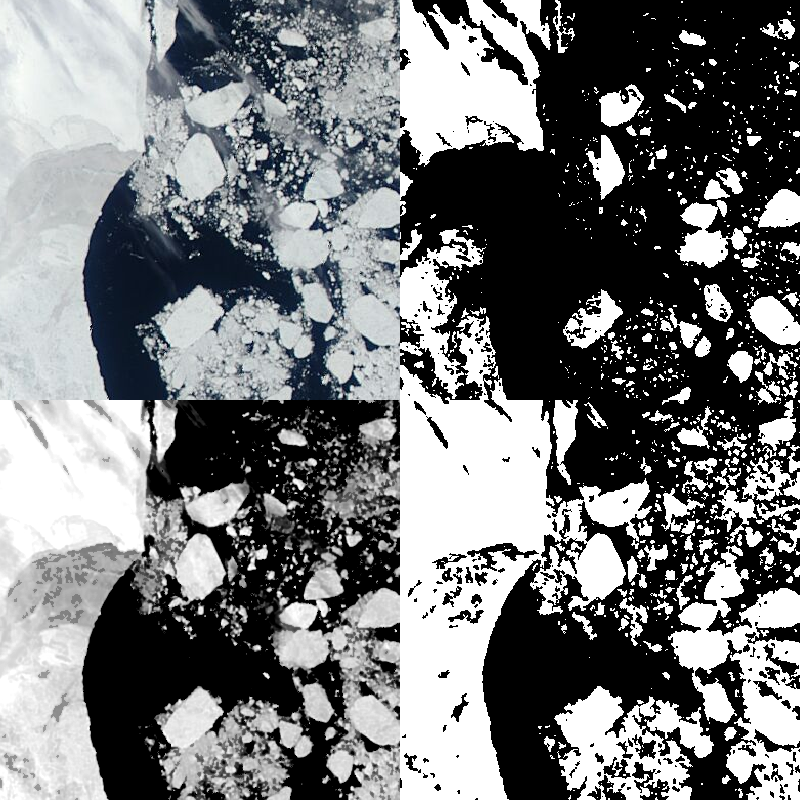

In [28]:
ice_masks_params = (
    band_7_threshold=5,
    band_2_threshold=230,
    band_1_threshold=240,
    band_7_threshold_relaxed=10,
    band_1_threshold_relaxed=190,
    possible_ice_threshold=75,
    k=5, # number of clusters for kmeans segmentation
    factor=255, # normalization factor to convert images to uint8
)
morphed_image_int = Array(Int64.(floor.(Gray.(morphed) .* 255)))
prelim_sizes = size(truecolor) .÷ 2
tiles = IceFloeTracker.get_tiles(truecolor, prelim_sizes[1] + 1)
prelim_icemask, binarized_tiling = IceFloeTracker.get_ice_masks(
        n0f8.(falsecolor), morphed_image_int, landmask_binary, tiles, true; ice_masks_params...
    )
Images.mosaicview([truecolor, morphed, Gray.(prelim_icemask),  Gray.(binarized_tiling)], nrow=2)

Overlay: agreement is white, disagreement is gray

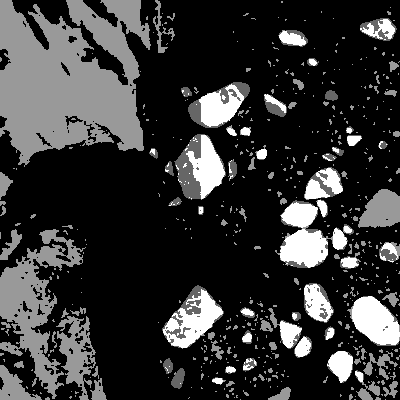

In [29]:
print("Overlay: agreement is white, disagreement is gray")
Images.mosaicview(0.4 .* labeled .+ 0.6 .* prelim_icemask)

In [30]:
kmeans_method = compute_metrics(prelim_icemask, labeled_binary, landmask_binary, cloudmask)

(precision = 0.28, recall = 0.68)

In [31]:
adpt_thresh_method = compute_metrics(binarized_tiling, labeled_binary, landmask_binary, cloudmask)

(precision = 0.19, recall = 0.97)